In [1]:
ENV["COLUMNS"] = 120

using Distributions
using LinearAlgebra
normsquared(x) = dot(x, x)
using Random
Random.seed!(4649373)
using StatsPlots
using Turing

In [2]:
# Jeffreys事前分布などのimproper事前分布を定義するために以下が使われる.

"""
    PowerPos(p::Real)

The *positive power distribution* with real-valued parameter `p` is the improper distribution
of real numbers that has the improper probability density function

```math
f(x) = \\begin{cases}
0 & \\text{if } x \\leq 0, \\\\
x^p & \\text{otherwise}.
\\end{cases}
```
"""
struct PowerPos{T<:Real} <: ContinuousUnivariateDistribution
    p::T
end
PowerPos(p::Integer) = PowerPos(float(p))

Base.minimum(d::PowerPos{T}) where T = zero(T)
Base.maximum(d::PowerPos{T}) where T = T(Inf)

Base.rand(rng::Random.AbstractRNG, d::PowerPos) = rand(rng) + 0.5
function Distributions.logpdf(d::PowerPos, x::Real)
    T = float(eltype(x))
    return x ≤ 0 ? T(-Inf) : d.p*log(x)
end

Distributions.pdf(d::PowerPos, x::Real) = exp(logpdf(d, x))

# For vec support
function Distributions.loglikelihood(d::PowerPos, x::AbstractVector{<:Real})
    T = float(eltype(x))
    return any(xi ≤ 0 for xi in x) ? T(-Inf) : d.p*log(prod(x))
end

@doc PowerPos

```
PowerPos(p::Real)
```

The *positive power distribution* with real-valued parameter `p` is the improper distribution of real numbers that has the improper probability density function

$$
f(x) = \begin{cases}
0 & \text{if } x \leq 0, \\
x^p & \text{otherwise}.
\end{cases}
$$


In [3]:
@model function ols(x, y)
    σ² ~ PowerPos(-1)
    β₀ ~ Flat()
    β₁ ~ Flat()
    y ~ MvNormal(β₀ .+ β₁*x, σ²*I)
end

ols (generic function with 2 methods)

β̂₀ = 1.113822386407124e6
β̂₁ = -101.38752478112757
s² = 3.5680616563187785e7


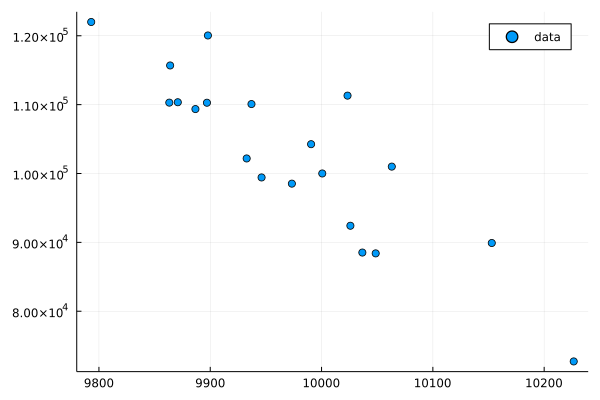

In [4]:
n = 20
t, e = 100randn(n), 100randn(n)
x = 10000 .+ t
y = 100000 .- 100t + 50e

X = x .^ (0:1)'
β̂₀, β̂₁ = X \ y
s² = 1/(n-2) * normsquared(y .- β̂₀ - β̂₁*x)
@show β̂₀ β̂₁ s²
scatter(x, y; label="data")

In [5]:
chn = sample(ols(x, y), NUTS(), MCMCThreads(), 2*10^4, 10);

┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC D:\.julia\packages\AdvancedHMC\51xgc\src\hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC D:\.julia\packages\AdvancedHMC\51xgc\src\hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC D:\.julia\packages\AdvancedHMC\51xgc\src\hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC D:\.julia\packages\AdvancedHMC\51xgc\src\hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC D:\.

┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC D:\.julia\packages\AdvancedHMC\51xgc\src\hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC D:\.julia\packages\AdvancedHMC\51xgc\src\hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC D:\.julia\packages\AdvancedHMC\51xgc\src\hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC D:\.julia\packages\AdvancedHMC\51xgc\src\hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC D:\.

┌ Info: Found initial step size
│   ϵ = 6.103515625e-6
└ @ Turing.Inference D:\.julia\packages\Turing\szPqN\src\inference\hmc.jl:191
┌ Info: Found initial step size
│   ϵ = 6.103515625e-6
└ @ Turing.Inference D:\.julia\packages\Turing\szPqN\src\inference\hmc.jl:191
┌ Info: Found initial step size
│   ϵ = 3.0517578125e-6
└ @ Turing.Inference D:\.julia\packages\Turing\szPqN\src\inference\hmc.jl:191
┌ Info: Found initial step size
│   ϵ = 1.220703125e-5
└ @ Turing.Inference D:\.julia\packages\Turing\szPqN\src\inference\hmc.jl:191
┌ Info: Found initial step size
│   ϵ = 1.220703125e-5
└ @ Turing.Inference D:\.julia\packages\Turing\szPqN\src\inference\hmc.jl:191
┌ Info: Found initial step size
│   ϵ = 1.220703125e-5
└ @ Turing.Inference D:\.julia\packages\Turing\szPqN\src\inference\hmc.jl:191
┌ Info: Found initial step size
│   ϵ = 3.0517578125e-6
└ @ Turing.Inference D:\.julia\packages\Turing\szPqN\src\inference\hmc.jl:191
┌ Info: Found initial step size
│   ϵ = 6.103515625e-6
└ @ Turing.I

In [6]:
chn

Chains MCMC chain (20000×15×10 Array{Float64, 3}):

Iterations        = 1001:1:21000
Number of chains  = 10
Samples per chain = 20000
Wall duration     = 230.66 seconds
Compute duration  = 2117.14 seconds
parameters        = σ², β₀, β₁
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters            mean             std     naive_se         mcse          ess      rhat   ess_per_sec 
      Symbol         Float64         Float64      Float64      Float64      Float64   Float64       Float64 

          σ²   40435890.6732   15189373.4117   33964.4715   71636.2339   47868.1550    1.0007       22.6099
          β₀    1114639.4108     137739.1191     307.9940     650.7621   48115.0413    1.0002       22.7265
          β₁       -101.4695         13.8130       0.0309       0.0653   48122.6320    1.0002       22.73

In [7]:
@show β̂₀ β̂₁ s²;

β̂₀ = 1.113822386407124e6
β̂₁ = -101.38752478112757
s² = 3.5680616563187785e7


In [8]:
plot(chn; lw=0.5, alpha=0.5)

In [9]:
function posterior_marginal(x_new, x, y)
    n, r = length(x), 2
    X = x .^ (0:1)'
    β̂ = X \ y
    s² = normsquared(y - X*β̂)/(n-r)
    ρ = √(s²*(x_new'/(X'X)*x_new))
    x_new'β̂ + ρ * TDist(n-r)
end

function preddist_marginal(x_new, x, y)
    n, r = length(x), 2
    X = x .^ (0:1)'
    β̂ = X \ y
    s² = normsquared(y - X*β̂)/(n-r)
    ρ = √(s²*(1 + x_new'/(X'X)*x_new))
    x_new'β̂ + ρ * TDist(n-r)
end

preddist_marginal (generic function with 1 method)

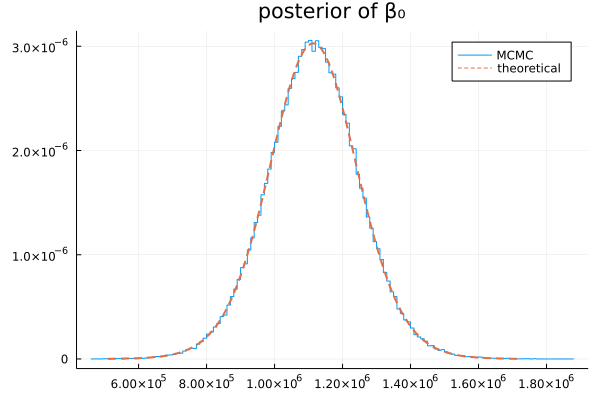

In [10]:
post_β₀ = posterior_marginal([1, 0], x, y)
stephist(vec(chn[:β₀]); norm=true, label="MCMC")
plot!(post_β₀; label="theoretical", ls=:dash, lw=2)
title!("posterior of β₀")

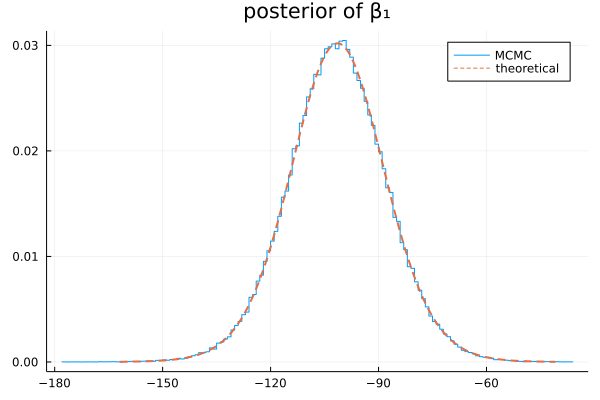

In [11]:
post_β₁ = posterior_marginal([0, 1], x, y)
stephist(vec(chn[:β₁]); norm=true, label="MCMC")
plot!(post_β₁; label="theoretical", ls=:dash, lw=2)
title!("posterior of β₁")